In [127]:
# get data
import torch
import torchvision

from datasets.CustomPoints import CustomPoints
from temp.siamunet_diff import SiamUnet_diff
from transforms.AppendFeatures import AppendFeatures
from transforms.AppendFeaturesTest import AppendFeaturesTest
import matplotlib.pyplot as plt

In [154]:


# path = '/Users/zygimantas/Downloads/samples224-24.291850173766075_54.49574260455312'
# model_checkpoint = '/Users/zygimantas/Documents/sources/geo/train-additional/models/ckpts/epoch=1-step=98000-v3.ckpt'
# feature_model_path = '/Users/zygimantas/Documents/sources/geo/train-additional/Prithvi_100M.pt'
# feature_model_checkpoint_path = '/Users/zygimantas/Documents/sources/geo/train-additional/Prithvi_100M_config.yaml'
# names_file = path + '/samples.txt'

# path = 'c:\\Users\\zygimantas\\Downloads\\samples224-26.26782334883508_55.7393778258525'
# path = 'C:\\Users\\zygimantas\\Downloads\\samples224-24.76065246329555_56.31369787642233' # hit 5 0.55
# path = 'C:\\Users\\zygimantas\\Downloads\\samples224-22.839346753321742_55.04317380765677' # hit 70 0.33
# path = 'C:\\Users\\zygimantas\\Downloads\\samples224-25.78423840656875_55.214553606849734' # hit X
# path = 'C:\\Users\\zygimantas\\Downloads\\samples224-25.769444315513795_54.88231543809578' # hit 6
# path = 'C:\\Users\\zygimantas\\Downloads\\samples224-25.51185887512389_54.451088355275' # hit X
path = 'C:\\Users\\zygimantas\\Downloads\\samples224-23.628422150966273_54.18481502617952' # hit X
path = 'C:\\Users\\zygimantas\\Downloads\\samples224-23.728166383684552_54.862031934217086' # hit X
path = 'C:\\Users\\zygimantas\\Downloads\\samples224-23.745981776989915_54.45133296451364' # hit 7
# model_checkpoint = '.neptune\\Untitled\\TRAIN-168\\checkpoints\\last_checkpoint.ckpt'
# model_checkpoint = '.neptune\\Untitled\\TRAIN-150\\checkpoints\\last-v7.ckpt'
model_checkpoint = 'c:\\Users\\zygimantas\\Downloads\\fc_siam_diff_final.tar'
feature_model_path = 'C:\\Users\\zygimantas\\Downloads\\Prithvi_100M.pt'
feature_model_checkpoint_path = 'C:\\Users\\zygimantas\\Downloads\\Prithvi_100M_config.yaml'
names_file = path + '\\samples.txt'

In [155]:

transform = AppendFeaturesTest(
    feature_model_path=feature_model_path, feature_model_checkpoint_path=feature_model_checkpoint_path)
dataset = CustomPoints(path=path, names_file=names_file)
dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=100, shuffle=False, num_workers=0)
# get model
model = SiamUnet_diff(13, 1, 50)

if model_checkpoint is not None:
    if torch.cuda.is_available():
        model.to('cuda')
        checkpoint = torch.load(model_checkpoint)
    else:
        checkpoint = torch.load(
            model_checkpoint, map_location=torch.device('cpu'))
    
    # if any weights in state-dict start with 'model.'
    if 'state_dict' in checkpoint:
        weights = {k: v for k,
                v in checkpoint["state_dict"].items() if k.startswith("model.")}
        # rename all keys to remove the "model." prefix
        weights = {k[6:]: v for k, v in weights.items()}
        model.load_state_dict(weights)
    else:
        weights = {k: v for k,
                v in checkpoint.items() if k not in ['upconv4.weight', 'upconv4.bias', 'conv11d.weight', 'conv11d.bias']}
        model.load_state_dict(weights, strict=False)

In [156]:

def masked_mean(tensor, mask):
    """Finding the mean along dim"""
    masked = torch.mul(
        tensor, mask)  # Apply the mask using an element-wise multiply
    return masked.sum() / mask.sum()  # Find the average!


confidence_pred = []
preds = []
# run model
with torch.no_grad():
    for x1, x2 in dataloader:
        if torch.cuda.is_available():
            x1 = x1.cuda()
            x2 = x2.cuda()
        x1, x2, feat1, feat2 = transform((x1, x2))
        y_out = model(x1, x2, feat1, feat2)
        x1, x2, y_out = x1.cpu(), x2.cpu(), y_out.cpu()
        # loop through the batch
        for i in range(y_out.shape[0]):
            x1L = x1[i, :, :, :]
            x2L = x2[i, :, :, :]
            y_outL = y_out[i, :, :, :]
            preds.append((x1L, x2L, y_outL))


torch.Size([1, 224, 224])


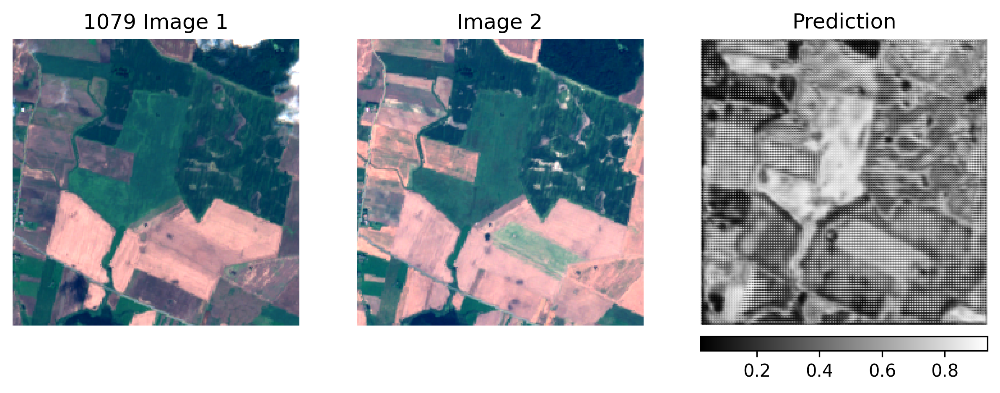

torch.Size([1, 224, 224])


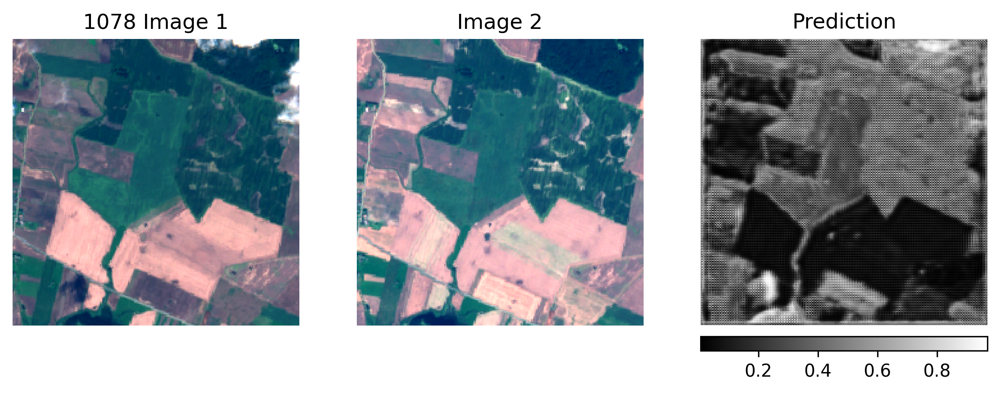

torch.Size([1, 224, 224])


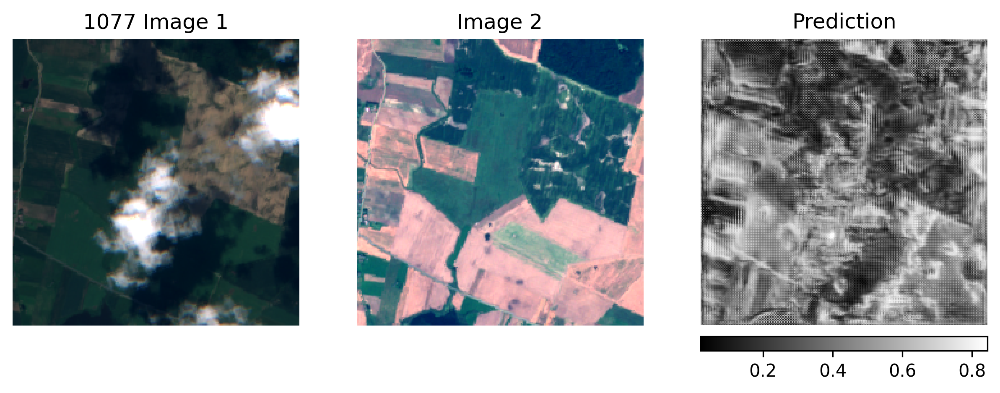

torch.Size([1, 224, 224])


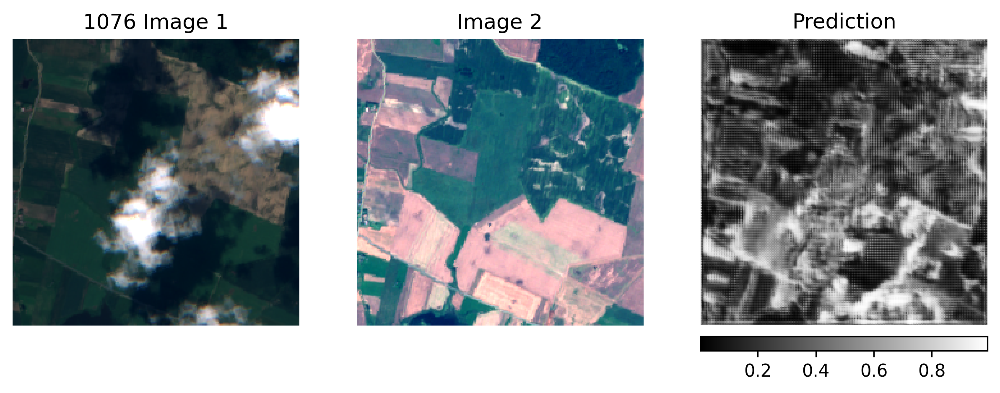

torch.Size([1, 224, 224])


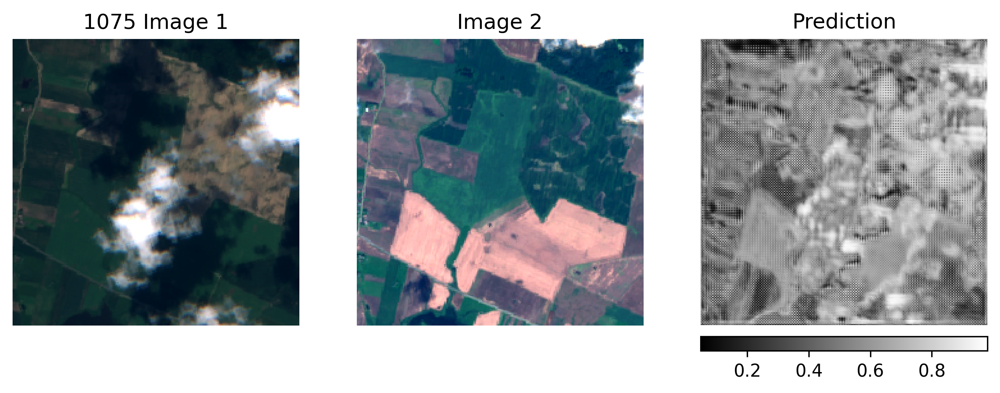

torch.Size([1, 224, 224])


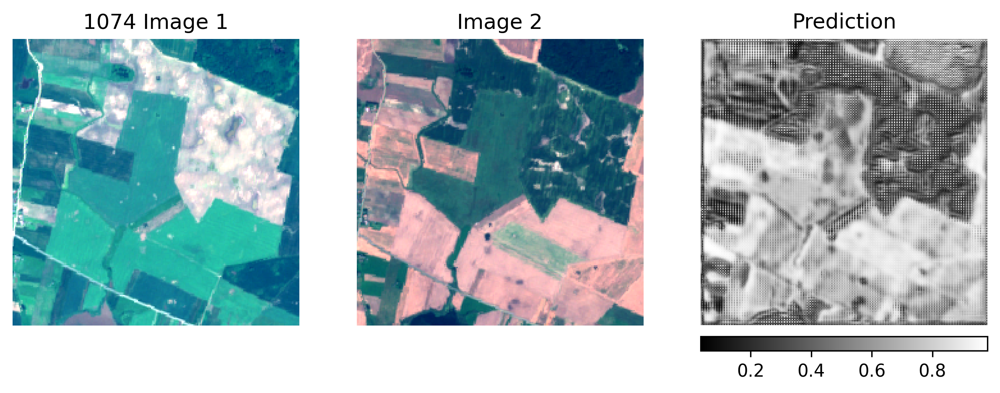

torch.Size([1, 224, 224])


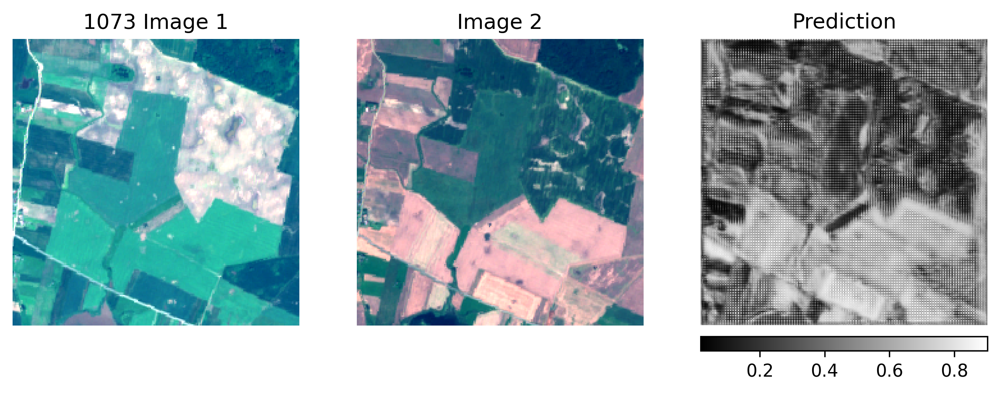

torch.Size([1, 224, 224])


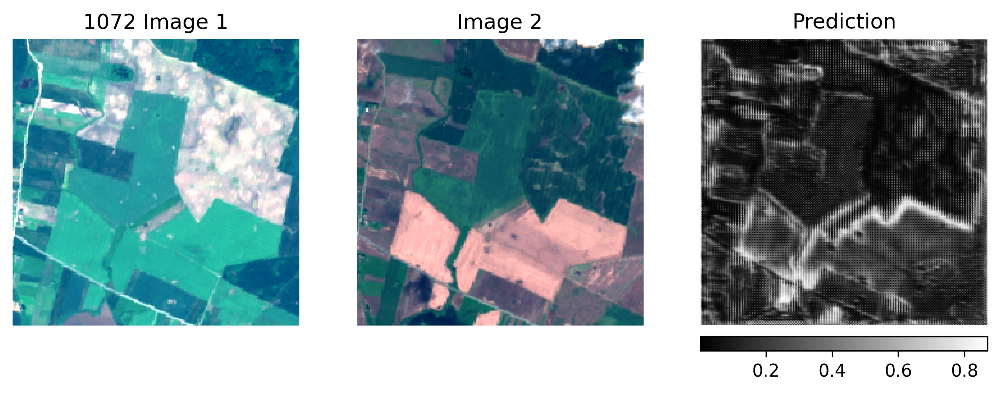

torch.Size([1, 224, 224])


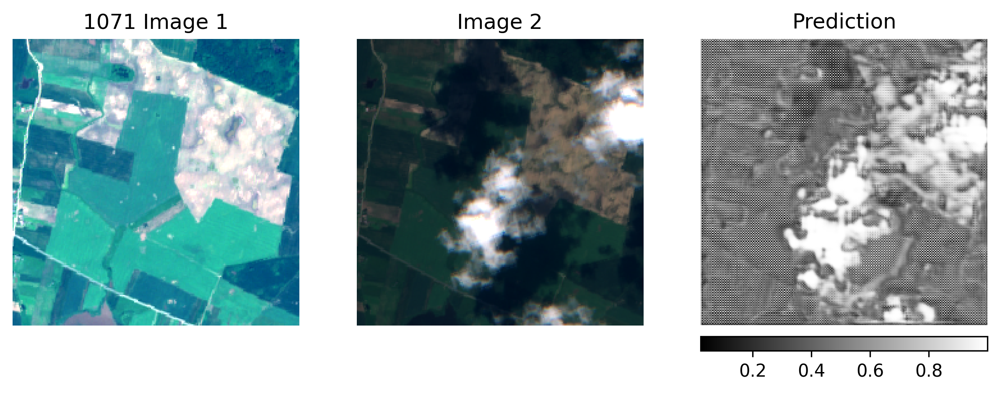

torch.Size([1, 224, 224])


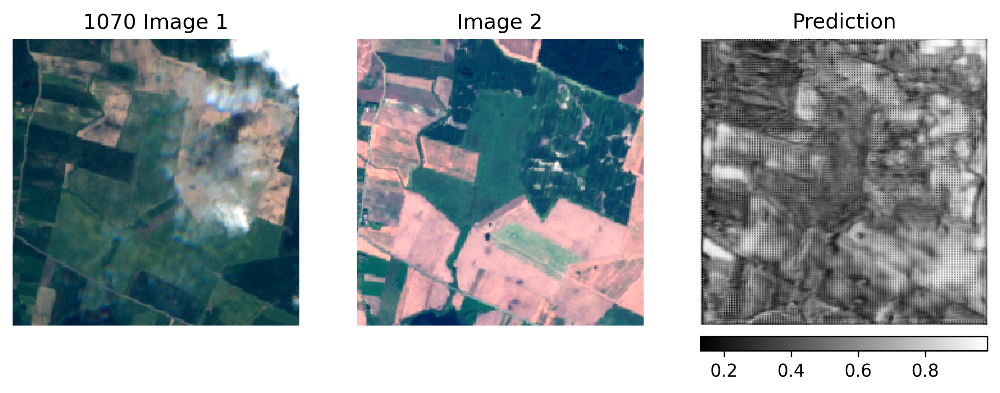

torch.Size([1, 224, 224])


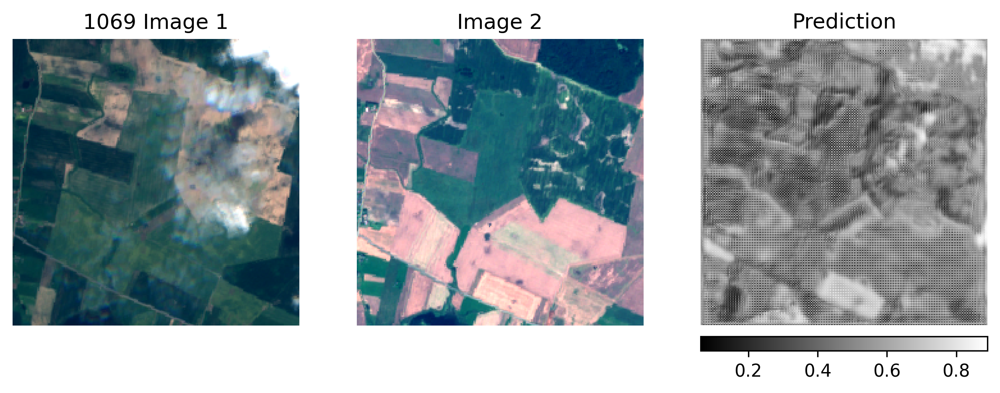

torch.Size([1, 224, 224])


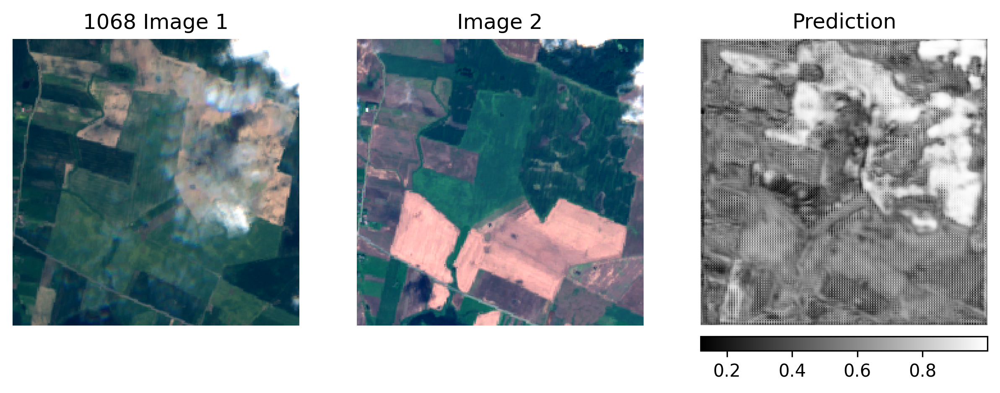

torch.Size([1, 224, 224])


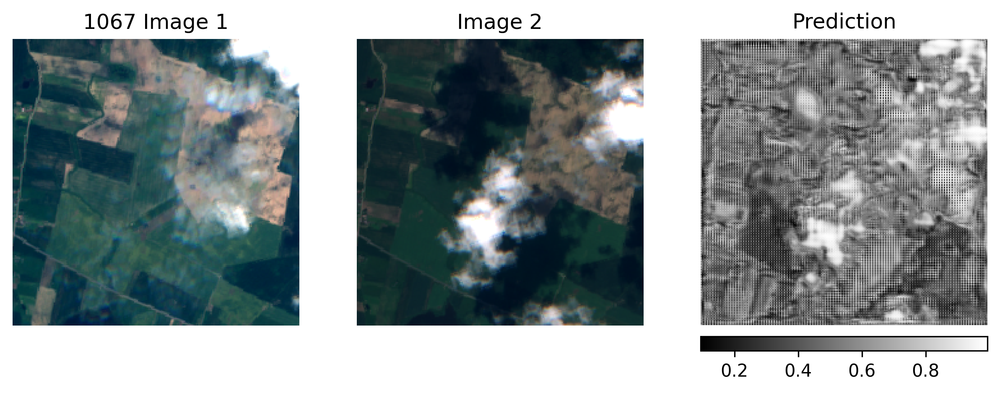

torch.Size([1, 224, 224])


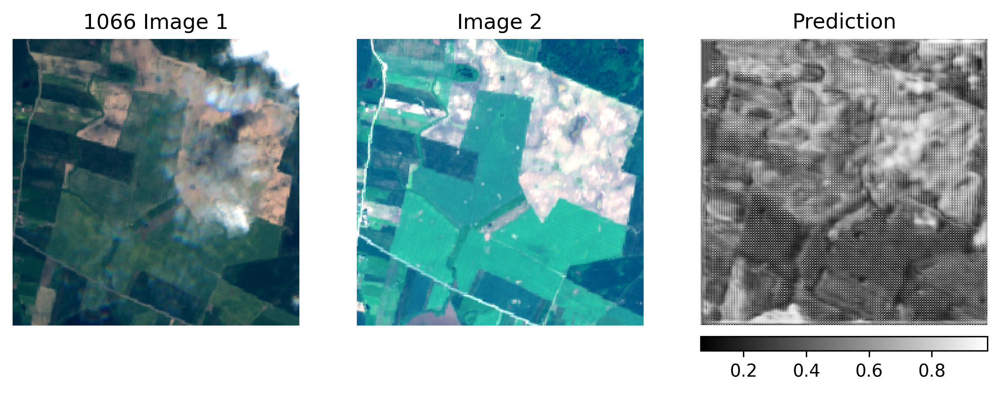

torch.Size([1, 224, 224])


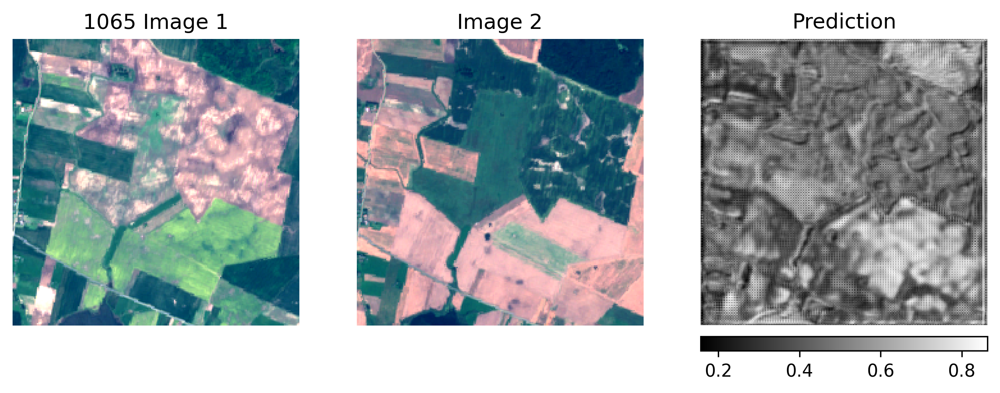

torch.Size([1, 224, 224])


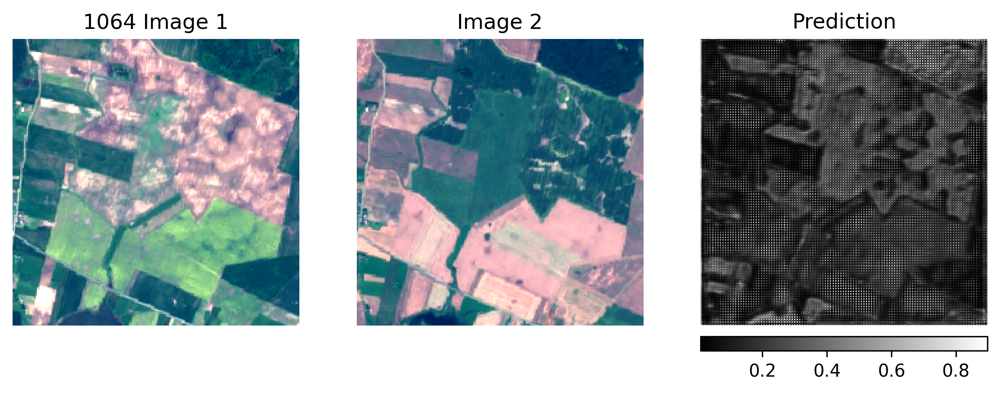

torch.Size([1, 224, 224])


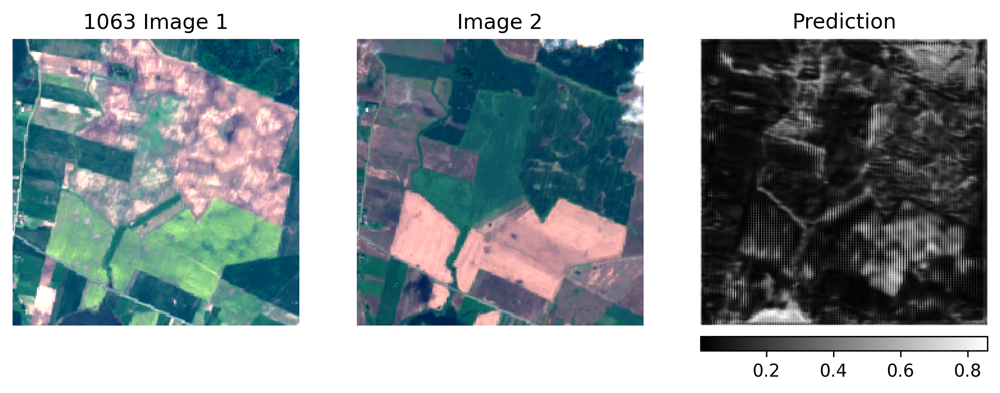

torch.Size([1, 224, 224])


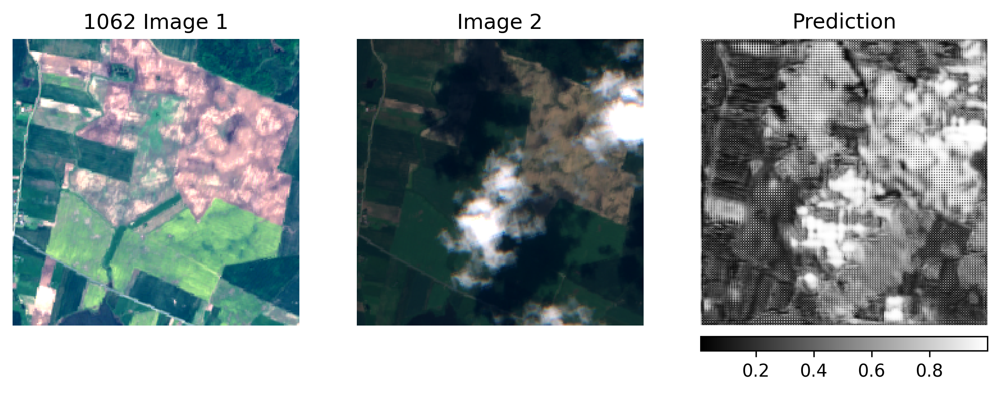

torch.Size([1, 224, 224])


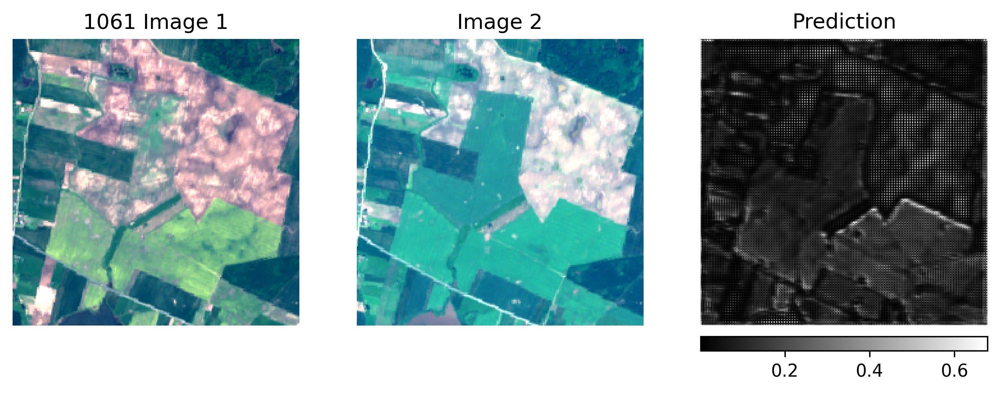

torch.Size([1, 224, 224])


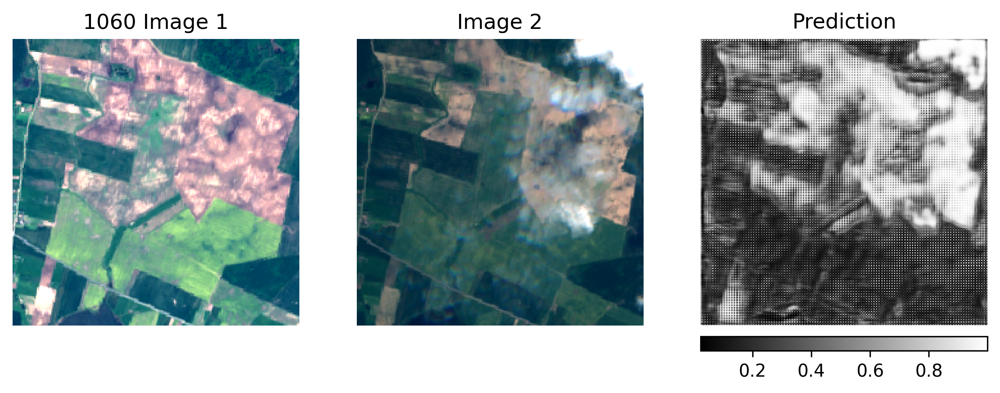

In [157]:
import matplotlib as mpl
import numpy as np
mpl.rcParams['figure.dpi'] = 300
import cv2

def normalize(x):
    x = x - x.min()
    x = x / (x.max() - x.min())
    return x

def contrast_stretching(image):
    p2, p98 = np.percentile(image, (2, 98))
    return np.clip((image - p2) * 255.0 / (p98 - p2), 0, 255).astype(np.uint8)

def gamma_correction(image, gamma=1.0):
    inv_gamma = 1.0 / gamma
    table = (np.linspace(0, 1, 256) ** inv_gamma) * 255
    table = np.clip(table, 0, 255).astype(np.uint8)
    corrected_channels = [cv2.LUT(np.uint8(255 * image[:, :, i]), table) for i in range(3)]
    return np.stack(corrected_channels, axis=-1)

def fix(image):
    # image = normalize(image)
    # image = np.uint8(255 * image)
    # image = image.astype(np.uint8)
    # Apply histogram equalization
    # image = cv2.equalizeHist(image)
    image = contrast_stretching(image)
    # image = gamma_correction(image, 1.5)
    return image

threshold = 0.0
confidence_pred = []
for i, (x1, x2, y_pred) in enumerate(preds):
    pred_mask = y_pred > threshold
    confidence = masked_mean(y_pred, pred_mask)
    confidence_pred.append((i, confidence, x1, x2, y_pred))
# sort confidence
confidence_pred.sort(key=lambda x: x[0], reverse=True)
# get top 20
top_20 = confidence_pred[:20]

for idx, (i, confidence, x1, x2, y_pred) in enumerate(top_20):
    # show image 1 row 3 columns
    plt.figure(figsize=(10, 10))
    plt.subplot(2, 3, 1)
    x1 = x1.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x1 = fix(x1)
    # correct brightness of sentinel image
    # x1 = np.clip(x1 * 2.5, 0, 1)
    plt.imshow(x1)
    plt.title(f'{i} Image 1')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    x2 = x2.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x2 = fix(x2)
    x1 = np.clip(x1 * 2.5, 0, 1)
    plt.imshow(x2)
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    print(y_pred.shape)
    y_pred = y_pred.squeeze().squeeze().numpy()
    # 1 - change, 0 - no change
    y_pred = y_pred * (y_pred > threshold)
    plt.imshow(y_pred, cmap='gray')
    plt.colorbar(location='bottom', orientation='horizontal', shrink=1, pad=0.025)
    plt.title('Prediction')
    plt.axis('off')
    plt.show()

interactive(children=(BoundedIntText(value=7, description='i', max=1079), FloatSlider(value=0.5, description='…

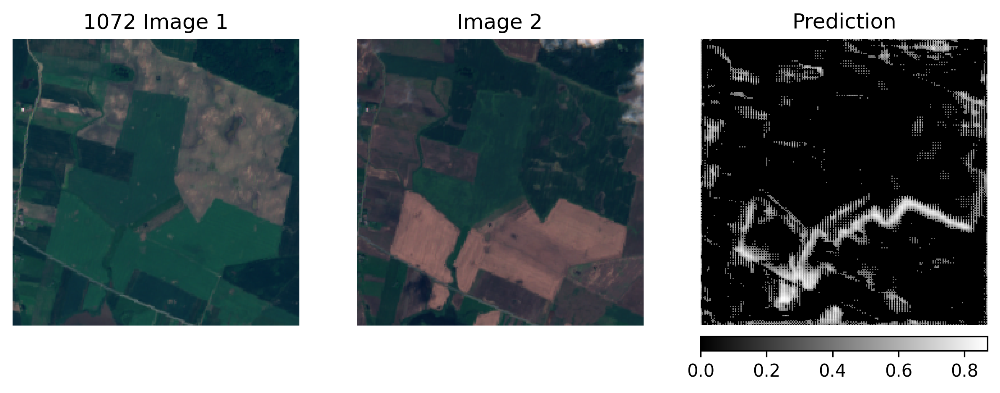

In [159]:
from ipywidgets import interact
import ipywidgets as widgets

def show_plot(i, threshold):
    i, confidence, x1, x2, y_pred = confidence_pred[i]
    # show image 1 row 3 columns
    plt.figure(figsize=(10, 10))
    plt.subplot(2, 3, 1)
    x1 = x1.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x1 = normalize(x1)
    # x1 = np.clip(x1 * 2.5, 0, 1)
    plt.imshow(x1)
    plt.title(f'{i} Image 1')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    x2 = x2.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x2 = normalize(x2)
    # x2 = np.clip(x2 * 2.5, 0, 1)
    plt.imshow(x2)
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    y_pred = y_pred.squeeze().squeeze().numpy()
    # 1 - change, 0 - no change
    y_pred = y_pred * (y_pred > threshold)
    plt.imshow(y_pred, cmap='gray')
    plt.colorbar(location='bottom', orientation='horizontal', shrink=1, pad=0.025)
    plt.title('Prediction')
    plt.axis('off')
    plt.show()


interact(show_plot, i=widgets.BoundedIntText(
    value=7,
    min=0,
    max=len(confidence_pred)-1,
    step=1,
    description='i',
    disabled=False
), threshold=(0.0, 1.0, 0.001))
show_plot(7, 0.35)

In [67]:
from ipywidgets import interact
import ipywidgets as widgets
import rasterio
from rasterio.enums import Resampling
import numpy as np

def read_image(image_name):
    with rasterio.open(image_name) as dataset:
        # resample data to target shape
        data = dataset.read(
            out_shape=(
                dataset.count,
                224,
                224
            ),
            resampling=Resampling.bilinear
        )
        return data

def get_model(path):
    model = SiamUnet_diff(13, 1, 50)

    if model_checkpoint is not None:
        if torch.cuda.is_available():
            model.to('cuda')
            checkpoint = torch.load(model_checkpoint)
        else:
            checkpoint = torch.load(
                model_checkpoint, map_location=torch.device('cpu'))
    weights = {k: v for k,
                v in checkpoint["state_dict"].items() if k.startswith("model.")}
    # rename all keys to remove the "model." prefix
    weights = {k[6:]: v for k, v in weights.items()}
    model.load_state_dict(weights)
    model.eval()
    return model

def normalize(x):
    x = x - x.min()
    x = x / (x.max() - x.min())
    return x

x1 = read_image('c:\\Users\\zygimantas\\Downloads\\sysa_2023-01-12.tif')
x2 = read_image('c:\\Users\\zygimantas\\Downloads\\sysa_2023-08-12.tif')
if torch.cuda.is_available():
    x1 = torch.tensor(x1.astype(np.float64), dtype=torch.float64).cuda().unsqueeze(0)
    x2 = torch.tensor(x2.astype(np.float64), dtype=torch.float64).cuda().unsqueeze(0)
x1, x2, feat1, feat2 = transform((x1, x2))

def show_plot(x1, x2, feat1, feat2, model_checkpoint, threshold):
    # model_checkpoint = 'c:\\Users\\zygimantas\\Downloads\\fc_siam_diff_final.tar'
    # model_checkpoint2 = '.neptune\\Untitled\\TRAIN-168\\checkpoints\\last_checkpoint.ckpt'
    model = get_model(model_checkpoint)
    with torch.no_grad():
        y_pred = model(x1.float(), x2.float(), feat1.float(), feat2.float())
    x1, x2, y_pred = x1.cpu(), x2.cpu(), y_pred.cpu()
    # show image 1 row 3 columns
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 3, 1)
    x1 = x1.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x1 = normalize(x1)
    x1 = np.clip(x1 * 2.5, 0, 1)
    plt.imshow(x1)
    plt.title('Image 1')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    x2 = x2.squeeze()[[3, 2, 1], :, :].numpy().transpose(1, 2, 0)
    x2 = normalize(x2)
    x2 = np.clip(x2 * 2.5, 0, 1)
    plt.imshow(x2)
    plt.title('Image 2')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    y_pred = y_pred.squeeze().squeeze().numpy()
    # 1 - change, 0 - no change
    y_pred = y_pred * (y_pred > threshold)
    plt.imshow(y_pred, cmap='gray')
    plt.title('Prediction')
    plt.axis('off')


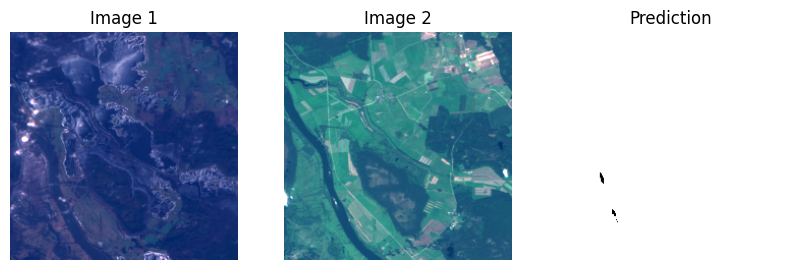

In [72]:
show_plot(x1, x2, feat1, feat2, '.neptune\\Untitled\\TRAIN-168\\checkpoints\\last_checkpoint.ckpt', 0)

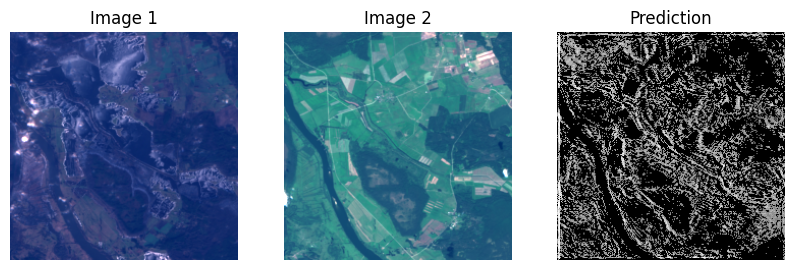

In [41]:
show_plot('c:\\Users\\zygimantas\\Downloads\\fc_siam_diff_final.tar', 0.5)